<a href="https://colab.research.google.com/github/gz54054/Homework/blob/main/Homework4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Get thinkdsp.py

import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from thinkdsp import decorate

## Exercise 1

``A Soft Murmur'' is a web site that plays a mixture of natural
noise sources, including rain, waves, wind, etc.  At
http://asoftmurmur.com/about/ you can find their list
of recordings, most of which are at http://freesound.org.

Download a few of these files and compute the spectrum of each
signal.  Does the power spectrum look like white noise, pink noise,
or Brownian noise?  How does the spectrum vary over time?

In [ ]:
if not os.path.exists('161478__phluidbox__tibetan-singing-bowls.wav'):
    !wget https://hub.gke2.mybinder.org/user/jupyterlab-jupyterlab-demo-36hv2lm7/doc/tree/demo/161478__phluidbox__tibetan-singing-bowls.wav

In [ ]:
from thinkdsp import read_wave

wave = read_wave('161478__phluidbox__tibetan-singing-bowls.wav')
wave.make_audio()

我從https://freesound.org/people/phluidbox/sounds/161478/
上選了一個鐘聲的聲音

In [ ]:
segment = wave.segment(start=1.0, duration=1.0)
segment.make_audio()

spectrum:

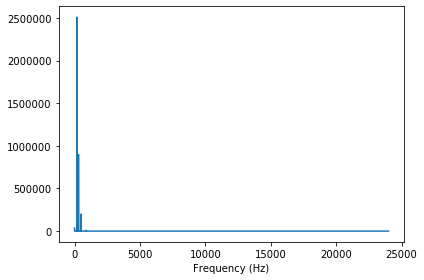

In [ ]:
spectrum = segment.make_spectrum()
spectrum.plot_power()
decorate(xlabel='Frequency (Hz)')

幅度隨頻率下降，所以這可能是紅色或粉紅色噪聲。我們可以通過查看對數刻度上的功率譜來檢查。

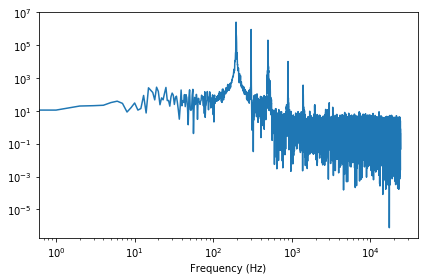

In [ ]:
spectrum.plot_power()

loglog = dict(xscale='log', yscale='log')
decorate(xlabel='Frequency (Hz)', **loglog)

可以看到振幅先由小變大，再由大變小，符合自然噪音的現象。


In [ ]:
segment2 = wave.segment(start=2.5, duration=1.0)
segment2.make_audio()

兩個spectrums:

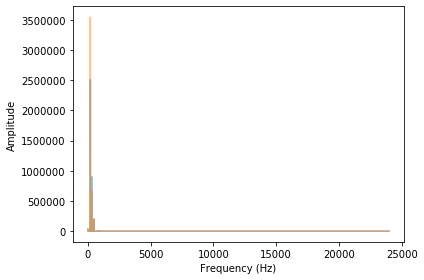

In [ ]:
spectrum2 = segment2.make_spectrum()

spectrum.plot_power(alpha=0.5)
spectrum2.plot_power(alpha=0.5)
decorate(xlabel='Frequency (Hz)',
         ylabel='Amplitude')

再做一次log-log scale:

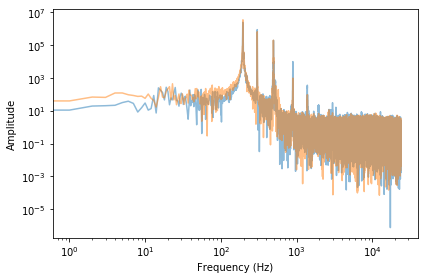

In [ ]:
spectrum.plot_power(alpha=0.5)
spectrum2.plot_power(alpha=0.5)
decorate(xlabel='Frequency (Hz)',
         ylabel='Amplitude',
         **loglog)

所以隨著時間的推移，結構似乎是一致的。

我們還可以查看頻譜圖：

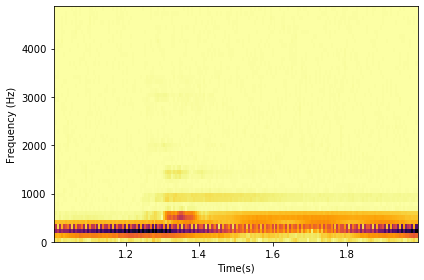

In [ ]:
segment.make_spectrogram(512).plot(high=5000)
decorate(xlabel='Time(s)', ylabel='Frequency (Hz)')

在該段內，整體頻率有基本上是一個穩定的區間

**Exercise:** In a noise signal, the mixture of frequencies changes over time.
In the long run, we expect the power at all frequencies to be equal,
but in any sample, the power at each frequency is random.

To estimate the long-term average power at each frequency, we can
break a long signal into segments, compute the power spectrum for each segment, and then compute the average across
the segments.  You can read more about this algorithm at
http://en.wikipedia.org/wiki/Bartlett's_method.

Implement Bartlett's method and use it to estimate the power
spectrum for a noise wave.  Hint: look at the implementation
of `make_spectrogram`.

In [ ]:
from thinkdsp import Spectrum

def bartlett_method(wave, seg_length=512, win_flag=True):
    """Estimates the power spectrum of a noise wave.
    
    wave: Wave
    seg_length: segment length
    """
    # make a spectrogram and extract the spectrums
    spectro = wave.make_spectrogram(seg_length, win_flag)
    spectrums = spectro.spec_map.values()
    
    # extract the power array from each spectrum
    psds = [spectrum.power for spectrum in spectrums]
    
    # compute the root mean power (which is like an amplitude)
    hs = np.sqrt(sum(psds) / len(psds))
    fs = next(iter(spectrums)).fs
    
    # make a Spectrum with the mean amplitudes
    spectrum = Spectrum(hs, fs, wave.framerate)
    return spectrum

bartlett_method 製作頻譜圖並提取spec_map，將時間映射到Spectrum 對象。它計算每個頻譜的PSD，將它們相加，並將結果放入Spectrum中。

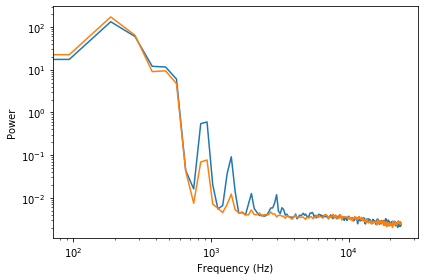

In [ ]:
psd = bartlett_method(segment)
psd2 = bartlett_method(segment2)

psd.plot_power()
psd2.plot_power()

decorate(xlabel='Frequency (Hz)', 
         ylabel='Power', 
         **loglog)

現在我們可以更清楚地看到功率和頻率的關係了，它不是簡單的線性關係，而是在不同的段之間是一致的，甚至在5000HZ附近、6000HZ附近和10000HZ以上的凹口等細節上也是一致的。

## Exercise 2

At [coindesk](https://www.coindesk.com/price/bitcoin) you can download the daily price of a BitCoin as a CSV file.  Read this file and compute
the spectrum of BitCoin prices as a function of time.
Does it resemble white, pink, or Brownian noise?

In [ ]:
if not os.path.exists('BTC_USD_2013-10-01_2021-06-24-CoinDesk.csv'):
    !wget https://hub.gke2.mybinder.org/user/jupyterlab-jupyterlab-demo-36hv2lm7/doc/tree/demo/BTC_USD_2013-10-01_2021-06-24-CoinDesk.csv

In [ ]:
import pandas as pd

df = pd.read_csv('BTC_USD_2013-10-01_2021-06-24-CoinDesk.csv', 
                 parse_dates=[0])
df

,Currency,Date,Closing Price (USD),24h Open (USD),24h High (USD),24h Low (USD)
0,BTC,2013-10-01,123.654990,124.304660,124.751660,122.563490
1,BTC,2013-10-02,125.455000,123.654990,125.758500,123.633830
2,BTC,2013-10-03,108.584830,125.455000,125.665660,83.328330
3,BTC,2013-10-04,118.674660,108.584830,118.675000,107.058160
4,BTC,2013-10-05,121.338660,118.674660,121.936330,118.005660
...,...,...,...,...,...,...
2819,BTC,2021-06-20,35656.304737,35856.815217,36474.033268,34968.012320
2820,BTC,2021-06-21,35681.133956,35516.445066,36119.799739,33380.577029
2821,BTC,2021-06-22,31659.541730,35602.053017,35736.708113,31531.906561
2822,BTC,2021-06-23,32404.330356,31614.550388,33247.789029,29031.314481


In [ ]:
ys = df['Closing Price (USD)']
ts = df.index

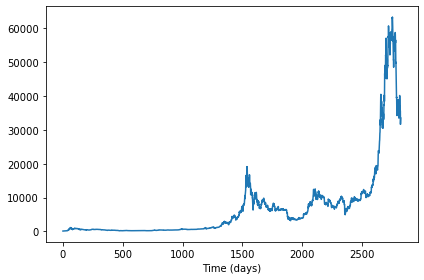

In [ ]:
from thinkdsp import Wave

wave = Wave(ys, ts, framerate=1)
wave.plot()
decorate(xlabel='Time (days)')

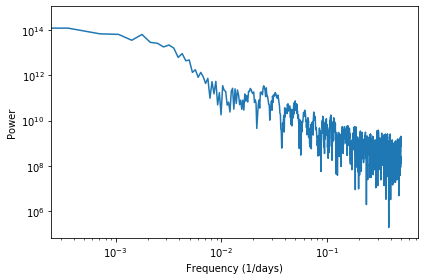

In [ ]:
spectrum = wave.make_spectrum()
spectrum.plot_power()
decorate(xlabel='Frequency (1/days)',
         ylabel='Power', 
         **loglog)

In [ ]:
spectrum.estimate_slope()[0]

-1.7981333103970079

紅噪聲的斜率應該是-2，這個PSD的斜率接近1.8，所以很難說是紅噪聲還是粉紅噪聲。

## Exercise 3

A Geiger counter is a device that detects radiation. When an ionizing particle strikes the detector, it outputs a surge of current. The total output at a point in time can be modeled as uncorrelated Poisson (UP) noise, where each sample is a random quantity from a Poisson distribution, which corresponds to the number of particles detected during an interval.

Write a class called `UncorrelatedPoissonNoise` that inherits from ` _Noise` and provides `evaluate`. It should use `np.random.poisson` to generate random values from a Poisson distribution. The parameter of this function, `lam`, is the average number of particles during each interval. You can use the attribute `amp` to specify `lam`. For example, if the framerate is 10 kHz and `amp` is 0.001, we expect about 10 “clicks” per second.

Generate about a second of UP noise and listen to it. For low values of `amp`, like 0.001, it should sound like a Geiger counter. For higher values it should sound like white noise. Compute and plot the power spectrum to see whether it looks like white noise. 

In [ ]:
from thinkdsp import Noise

class UncorrelatedPoissonNoise(Noise):
    """Represents uncorrelated Poisson noise."""

    def evaluate(self, ts):
        """Evaluates the signal at the given times.

        ts: float array of times
        
        returns: float wave array
        """
        ys = np.random.poisson(self.amp, len(ts))
        return ys

這是低水平"radiation"時的聲音:

In [ ]:
amp = 0.001
framerate = 10000
duration = 1

signal = UncorrelatedPoissonNoise(amp=amp)
wave = signal.make_wave(duration=duration, framerate=framerate)
wave.make_audio()

為了檢查是否有效，我們比較了預期的粒子數量和實際數量：

In [ ]:
expected = amp * framerate * duration
actual = sum(wave.ys)
print(expected, actual)

10.0 6


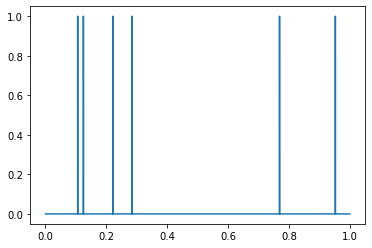

In [ ]:
wave.plot()

用power作出log-log圖:

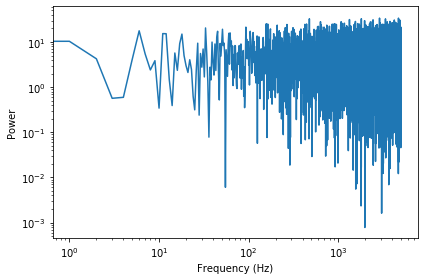

In [ ]:
spectrum = wave.make_spectrum()
spectrum.plot_power()
decorate(xlabel='Frequency (Hz)',
         ylabel='Power',
         **loglog)

In [ ]:
spectrum.estimate_slope().slope

0.002077576489016598

看起來像白噪音，斜率也接近0。

In [ ]:
amp = 1
framerate = 10000
duration = 1

signal = UncorrelatedPoissonNoise(amp=amp)
wave = signal.make_wave(duration=duration, framerate=framerate)
wave.make_audio()

振幅提高後，聽起來更接近白噪音了

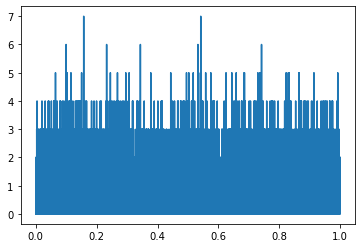

In [ ]:
wave.plot()

並且頻譜收斂於Gaussian noise。

In [ ]:
import matplotlib.pyplot as plt

def normal_prob_plot(sample, fit_color='0.8', **options):
    """Makes a normal probability plot with a fitted line.

    sample: sequence of numbers
    fit_color: color string for the fitted line
    options: passed along to Plot
    """
    n = len(sample)
    xs = np.random.normal(0, 1, n)
    xs.sort()
    
    ys = np.sort(sample)
    
    mean, std = np.mean(sample), np.std(sample)
    fit_ys = mean + std * xs
    plt.plot(xs, fit_ys, color='gray', alpha=0.5, label='model')

    plt.plot(xs, ys, **options)

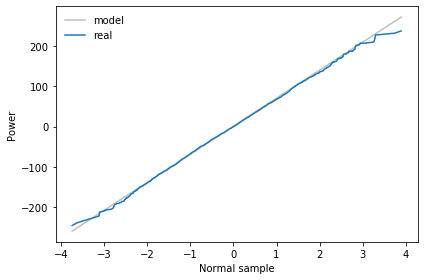

In [ ]:
spectrum = wave.make_spectrum()
spectrum.hs[0] = 0

normal_prob_plot(spectrum.real, label='real')
decorate(xlabel='Normal sample',
        ylabel='Power')

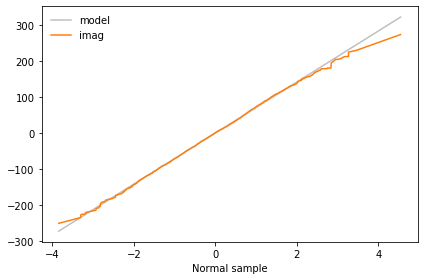

In [ ]:
normal_prob_plot(spectrum.imag, label='imag', color='C1')
decorate(xlabel='Normal sample')

## Exercise 4.5

The algorithm in this chapter for generating pink noise is
conceptually simple but computationally expensive.  There are
more efficient alternatives, like the Voss-McCartney algorithm.
Research this method, implement it, compute the spectrum of
the result, and confirm that it has the desired relationship
between power and frequency.

這個算法的基本思想是將幾個以不同採樣率更新的隨機數序列相加。第一個源應該在每個時間步更新；第二個源每隔一個時間步更新，第三個源永遠第四步，以此類推。

在原始算法中，更新間隔均勻。在 http://www.firstpr.com.au/dsp/pink-noise/ 提出的替代方案中，它們是隨機間隔的。

我的實現從一個數組開始，每個時間步長一行，每個白噪聲源一列。最初，第一行和第一列是隨機的，數組的其餘部分是 Nan。

In [ ]:
nrows = 100
ncols = 5

array = np.empty((nrows, ncols))
array.fill(np.nan)
array[0, :] = np.random.random(ncols)
array[:, 0] = np.random.random(nrows)
array[0:6]

array([[0.59753504, 0.6146456 , 0.17908802, 0.00451433, 0.88662518],
       [0.93875819,        nan,        nan,        nan,        nan],
       [0.03546422,        nan,        nan,        nan,        nan],
       [0.25907715,        nan,        nan,        nan,        nan],
       [0.02282932,        nan,        nan,        nan,        nan],
       [0.49983977,        nan,        nan,        nan,        nan]])

下一步是選擇隨機源發生變化的位置，如果行數為n，則第一列的變化數為n，第二列的數平均為n / 2，第三列平均為 n / 4，依此類推。

所以矩陣中的變化總數平均為 2n；因為其中 n 在第一列，其他 n 在矩陣的其餘部分。

為了放置剩餘的 n 個變化，我們從 p = 0.5 的幾何分佈中生成隨機列。如果我們生成的值超出範圍，我們將其設置為 0（因此第一列獲得額外的值）。

In [ ]:
p = 0.5
n = nrows
cols = np.random.geometric(p, n)
cols[cols >= ncols] = 0
cols

array([3, 2, 1, 1, 0, 2, 2, 1, 4, 1, 1, 0, 3, 4, 1, 0, 1, 2, 3, 1, 3, 2,
       3, 2, 1, 2, 2, 1, 1, 2, 2, 1, 1, 2, 1, 2, 1, 3, 1, 2, 1, 0, 2, 3,
       1, 1, 1, 2, 2, 1, 2, 2, 2, 0, 2, 2, 1, 1, 2, 1, 2, 2, 0, 1, 3, 1,
       2, 1, 2, 2, 1, 3, 0, 4, 2, 2, 4, 1, 3, 1, 3, 3, 1, 2, 2, 2, 2, 1,
       3, 0, 2, 1, 1, 1, 3, 3, 1, 1, 2, 0])

在每一列中，我們從均勻分佈中隨機選擇一行。理想情況下，我們會選擇不放回，但有時放回選擇會更快更容易。

In [ ]:
rows = np.random.randint(nrows, size=n)
rows

array([83, 14, 59, 28, 39, 29, 48, 24,  4,  1, 54, 16, 28, 47, 10, 14, 15,
       56, 32, 67,  7, 82, 93, 27, 68, 81, 10, 89, 33, 68, 22, 60, 76,  5,
       12,  8, 24, 31, 10, 87, 28, 60, 33, 10, 67, 88, 49, 66, 52,  5, 64,
       55, 13, 42, 86, 71, 35, 14, 68, 80, 74, 74, 46, 82, 17, 34, 53, 31,
       64, 54, 83, 72, 60, 76, 34, 54, 73, 23, 53, 55, 84, 27, 82, 85, 95,
       80, 80, 97, 48, 26, 31, 11, 62, 69, 94, 60, 88,  0, 94, 39])